In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Read the Data
adult_df = pd.read_csv("adult_data.csv", header = None, delimiter = ' *, *')
# Since our data does not have any header hence header = None.
#delimiter = ' *, *' used to remove leading and trailing space from the data i.e. from ?.
adult_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [3]:
# Check the dimension of the data
adult_df.shape

(32561, 15)

In [4]:
# We can view that our data does not have column name defined.
adult_df.columns

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], dtype='int64')

In [5]:
# We can rename the column name based on problem description
adult_df.columns = ['age', 'workclass', 'fnlwgt', 'education', 'education_num',
                    'marital_status', 'occupation', 'relationship',
                    'race', 'sex', 'capital_gain', 'capital_loss',
                    'hours_per_week', 'native_country', 'income']
adult_df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [6]:
# Check the column name
adult_df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'marital_status', 'occupation', 'relationship', 'race', 'sex',
       'capital_gain', 'capital_loss', 'hours_per_week', 'native_country',
       'income'],
      dtype='object')

# PreProcessing of the Data

In [7]:
# TO display all the data irrespective of width and height
pd.set_option("Display.max_columns", None)

In [8]:
# BEfore performing EDA we need to copy the orginal dataframe and save it into another data frame so that we won't harm any of our original data
adult_df_rev = pd.DataFrame.copy(adult_df)

In [9]:
# Variable Selection == Based on Problem Statement we can remove variable not so important before doing eda on our model.
"""
fnlwgt = does not have any relation with Income and hence we will remove it.
education = education and education_num are 2 variables with same meaning i.e. Education has bunch of category and each category has assigned
a number which is available in education_num. If education has 3 categories Bachelor, Graduate, PG, so iin education_num it is defined as
1, 2, 3 and hence out of both we can remove one.
The reason to keep education_num instead of education is sklearn library wants data to be numeric ond not string.
"""
adult_df_rev = adult_df_rev.drop(["fnlwgt", "education"], axis = 1)

In [10]:
adult_df_rev.shape

(32561, 13)

In [11]:
# isnull() will find all blank, NA, NaN data and consider it as missing value. It won't consider character data like ? as missing value
adult_df_rev.isnull().sum()

age               0
workclass         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64

In [12]:
# LEt's find out which all data has Missing value. This can be found out by using value_counts() or unique() function
for i in adult_df_rev.columns:
    print(adult_df_rev[i].value_counts())

36    898
31    888
34    886
23    877
35    876
     ... 
83      6
88      3
85      3
86      1
87      1
Name: age, Length: 73, dtype: int64
Private             22696
Self-emp-not-inc     2541
Local-gov            2093
?                    1836
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: workclass, dtype: int64
9     10501
10     7291
13     5355
14     1723
11     1382
7      1175
12     1067
6       933
4       646
15      576
5       514
8       433
16      413
3       333
2       168
1        51
Name: education_num, dtype: int64
Married-civ-spouse       14976
Never-married            10683
Divorced                  4443
Separated                 1025
Widowed                    993
Married-spouse-absent      418
Married-AF-spouse           23
Name: marital_status, dtype: int64
Prof-specialty       4140
Craft-repair         4099
Exec-managerial      4066
Adm-clerical         3770
Sales   

In [13]:
# LEt's find out which all data has Missing value. This can be found out by using value_counts() or unique() function
for i in adult_df_rev.columns:
    print(adult_df_rev[i].unique())

[39 50 38 53 28 37 49 52 31 42 30 23 32 40 34 25 43 54 35 59 56 19 20 45
 22 48 21 24 57 44 41 29 18 47 46 36 79 27 67 33 76 17 55 61 70 64 71 68
 66 51 58 26 60 90 75 65 77 62 63 80 72 74 69 73 81 78 88 82 83 84 85 86
 87]
['State-gov' 'Self-emp-not-inc' 'Private' 'Federal-gov' 'Local-gov' '?'
 'Self-emp-inc' 'Without-pay' 'Never-worked']
[13  9  7 14  5 10 12 11  4 16 15  3  6  2  1  8]
['Never-married' 'Married-civ-spouse' 'Divorced' 'Married-spouse-absent'
 'Separated' 'Married-AF-spouse' 'Widowed']
['Adm-clerical' 'Exec-managerial' 'Handlers-cleaners' 'Prof-specialty'
 'Other-service' 'Sales' 'Craft-repair' 'Transport-moving'
 'Farming-fishing' 'Machine-op-inspct' 'Tech-support' '?'
 'Protective-serv' 'Armed-Forces' 'Priv-house-serv']
['Not-in-family' 'Husband' 'Wife' 'Own-child' 'Unmarried' 'Other-relative']
['White' 'Black' 'Asian-Pac-Islander' 'Amer-Indian-Eskimo' 'Other']
['Male' 'Female']
[ 2174     0 14084  5178  5013  2407 14344 15024  7688 34095  4064  4386
  7298  1409  3

In [17]:
# Check the data types
adult_df_rev.dtypes
#missing value in special form like ? is alays present in object or category data only

age                int64
workclass         object
education_num      int64
marital_status    object
occupation        object
relationship      object
race              object
sex               object
capital_gain       int64
capital_loss       int64
hours_per_week     int64
native_country    object
income            object
dtype: object

In [15]:
# Replacing ? value with NaN
adult_df_rev = adult_df_rev.replace(["?"], np.nan)
# ["?"] because if there are more than one characters then this we can add it to list and all the value will get replaced by nan.

In [16]:
# Now check the missing values
adult_df_rev.isnull().sum()
# isnull() will return boolean value i.e TRUE means (NA, NAN, blank) is present and false means not present. Using sum() along with it means we are summing all the True values.

age                  0
workclass         1836
education_num        0
marital_status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital_gain         0
capital_loss         0
hours_per_week       0
native_country     583
income               0
dtype: int64

In [18]:
"""
Since all the missing value is of Categorical data we will be replacing them with Mode and instead of executing line by line
we will execute for loop and replace all of them at one go.
mode() return mode value of that variable and mode is only central tendency that will have more than one value. Mean, Median have only one value
mode()[0] means to replace NA with the first mode value. If there is 3 mode value index would be 0, 1, 2 so mode()[0] will make sure 0 index value is returend.
"""
for i in ["workclass", "occupation", "native_country"]:
    adult_df_rev[i].fillna(adult_df_rev[i].mode()[0], inplace = True)

In [19]:
# Check if the Missing value is treated or not
adult_df_rev.isnull().sum()

age               0
workclass         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64

# Category to Numeric Data

In [21]:
# First Copy the adult_df_Rev data into new variable so that changes won't effect new data.
income = pd.DataFrame.copy(adult_df_rev)

In [22]:
# Check the shape of the Data just to cross-Check if data has copied correctly
income.shape

(32561, 13)

In [23]:
"""
There are Three ways in which we can convert Category to Numeric Data
a) get_dummies() 
b) OneHotEncoder
c) LabelEncoder
"""

'\nThere are Three ways in which we can convert Category to Numeric Data\na) get_dummies() \nb) OneHotEncoder\nc) LabelEncoder\n'

# LabelEncoder Method

In [20]:
colname = []
for x in adult_df_rev.columns:
    if adult_df_rev[x].dtypes == "object":
        colname.append(x)
colname

['workclass',
 'marital_status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'native_country',
 'income']

In [25]:
from sklearn import preprocessing
le=preprocessing.LabelEncoder()
for x in colname: 
    adult_df_rev[x]=le.fit_transform(adult_df_rev[x])

In [26]:
adult_df_rev.shape

(32561, 13)

In [27]:
adult_df_rev.head()

,age,workclass,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,6,13,4,0,1,4,1,2174,0,40,38,0
1,50,5,13,2,3,0,4,1,0,0,13,38,0
2,38,3,9,0,5,1,4,1,0,0,40,38,0
3,53,3,7,2,5,0,2,1,0,0,40,38,0
4,28,3,13,2,9,5,2,0,0,0,40,4,0


In [28]:
# Check wheather the data types of all the variable have been changed or not
adult_df_rev.dtypes

age               int64
workclass         int64
education_num     int64
marital_status    int64
occupation        int64
relationship      int64
race              int64
sex               int64
capital_gain      int64
capital_loss      int64
hours_per_week    int64
native_country    int64
income            int64
dtype: object

In [29]:
# Split the Data into X & Y where X contain all the Independent Variable and Y contain Dependent Variable
X = adult_df_rev.values[ : , 0 : -1]
Y = adult_df_rev.values[ : , -1]

In [30]:
X.shape

(32561, 12)

In [31]:
Y

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

# Standardization(Scaling) 

In [32]:
X

array([[39,  6, 13, ...,  0, 40, 38],
       [50,  5, 13, ...,  0, 13, 38],
       [38,  3,  9, ...,  0, 40, 38],
       ...,
       [58,  3,  9, ...,  0, 40, 38],
       [22,  3,  9, ...,  0, 20, 38],
       [52,  4,  9, ...,  0, 40, 38]], dtype=int64)

In [33]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)
print(X)

[[ 0.03067056  2.62429763  1.13473876 ... -0.21665953 -0.03542945
   0.26136999]
 [ 0.83710898  1.72109965  1.13473876 ... -0.21665953 -2.22215312
   0.26136999]
 [-0.04264203 -0.08529633 -0.42005962 ... -0.21665953 -0.03542945
   0.26136999]
 ...
 [ 1.42360965 -0.08529633 -0.42005962 ... -0.21665953 -0.03542945
   0.26136999]
 [-1.21564337 -0.08529633 -0.42005962 ... -0.21665953 -1.65522476
   0.26136999]
 [ 0.98373415  0.81790166 -0.42005962 ... -0.21665953 -0.03542945
   0.26136999]]


In [34]:
np.set_printoptions(threshold=np.inf)
# Above code will print value in X dataset and not some truncated value. Compare above and below o/p to find difference

In [35]:
X

array([[ 3.06705574e-02,  2.62429763e+00,  1.13473876e+00,
         9.21633947e-01, -1.54525577e+00, -2.77805039e-01,
         3.93667527e-01,  7.03071345e-01,  1.48452895e-01,
        -2.16659527e-01, -3.54294470e-02,  2.61369989e-01],
       [ 8.37108980e-01,  1.72109965e+00,  1.13473876e+00,
        -4.06212201e-01, -7.90091680e-01, -9.00180839e-01,
         3.93667527e-01,  7.03071345e-01, -1.45920484e-01,
        -2.16659527e-01, -2.22215312e+00,  2.61369989e-01],
       [-4.26420266e-02, -8.52963304e-02, -4.20059624e-01,
        -1.73405835e+00, -2.86648951e-01, -2.77805039e-01,
         3.93667527e-01,  7.03071345e-01, -1.45920484e-01,
        -2.16659527e-01, -3.54294470e-02,  2.61369989e-01],
       [ 1.05704673e+00, -8.52963304e-02, -1.19745882e+00,
        -4.06212201e-01, -2.86648951e-01, -9.00180839e-01,
        -1.96262077e+00,  7.03071345e-01, -1.45920484e-01,
        -2.16659527e-01, -3.54294470e-02,  2.61369989e-01],
       [-7.75767866e-01, -8.52963304e-02,  1.1347387

In [36]:
# While using labelencoder we have converted all categorical to numerical including our Y and it's data type is integer.
# Just for precaution we have to make sure it stays Integer not object maybe because of some trailling space ahead or back from it's value.
# Converting it to Integer
#Y = Y.astype(int)


# Running a Basic Model

In [37]:
# Split the data
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3,
                                                    random_state=10)  


In [38]:
from sklearn.linear_model import LogisticRegression
classifier=LogisticRegression()
classifier.fit(X_train,Y_train)
Y_pred=classifier.predict(X_test)
print(list(zip(Y_test,Y_pred)))

[(0, 0), (0, 0), (1, 1), (0, 0), (1, 1), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 1), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 0), (1, 0), (0, 0), (0, 0), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 0), (0, 1), (0, 0), (0, 0), (1, 0), (1, 1), (1, 0), (0, 0), (1, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 1), (1, 0), (0, 0), (0, 0), (1, 0), (1, 1), (0, 1), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 1), (0, 0), (1, 0), (0, 0), (0, 1), (1, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 0), (1, 0), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 1), (0, 0), (1, 1), (1, 0), (0, 0), (1, 0), (1, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 0), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0),

In [39]:
print(adult_df_rev.columns[:-1])
print("-----*****-----")
print(classifier.coef_)
print("-----*****-----")
print(classifier.coef_.ravel())

Index(['age', 'workclass', 'education_num', 'marital_status', 'occupation',
       'relationship', 'race', 'sex', 'capital_gain', 'capital_loss',
       'hours_per_week', 'native_country'],
      dtype='object')
-----*****-----
[[ 0.47914235 -0.10451762  0.86310829 -0.34832939 -0.01659932 -0.18082614
   0.11572266  0.4281952   2.42686909  0.28596836  0.37954959  0.00881801]]
-----*****-----
[ 0.47914235 -0.10451762  0.86310829 -0.34832939 -0.01659932 -0.18082614
  0.11572266  0.4281952   2.42686909  0.28596836  0.37954959  0.00881801]


In [40]:
# To print the Co-efficients value of all our Independent Variable
print(list(zip(adult_df_rev.columns[:-1],classifier.coef_.ravel())))
print("Beta0 Value is =",classifier.intercept_)

[('age', 0.4791423453332532), ('workclass', -0.10451761549954884), ('education_num', 0.8631082873763225), ('marital_status', -0.34832938621215265), ('occupation', -0.016599322165540442), ('relationship', -0.18082614346885204), ('race', 0.11572266078536007), ('sex', 0.4281952029259951), ('capital_gain', 2.4268690916627014), ('capital_loss', 0.2859683571951049), ('hours_per_week', 0.3795495865804007), ('native_country', 0.008818008059065626)]
Beta0 Value is = [-1.50218566]


In [41]:
# Printing confusion_matrix, accuracy_score, classification_report from metrics library and sklearn Package.
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
# Confusion Matrix is done on Y data i.e. Actual value and predicted.
cfm=confusion_matrix(Y_test,Y_pred)
print(cfm)
# Classification Report will print all the necessary value i.e. Accuracy, Recall, Precission, F1-Score
print("Classification report: ")

print(classification_report(Y_test,Y_pred))
# To Print the accuracy of our predicted data
acc=accuracy_score(Y_test, Y_pred)
print("Accuracy of the model: ",acc)

[[7017  406]
 [1316 1030]]
Classification report: 
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      7423
           1       0.72      0.44      0.54      2346

    accuracy                           0.82      9769
   macro avg       0.78      0.69      0.72      9769
weighted avg       0.81      0.82      0.81      9769

Accuracy of the model:  0.8237281195618794


ADJUSTING THE THRESHOLD VALUE.

In [60]:
""" 
Above output or confusion matrix is for threshold = 0.5 which is by default. After judiging the above output we can try changing the
Threshold value. Ideal range for threshold is 0.4 - 0.6. We can try for multiple threshold as shown below.
"""

' \nAbove output or confusion matrix is for threshold = 0.5 which is by default. After judiging the above output we can try changing the\nThreshold value. Ideal range for threshold is 0.4 - 0.6. We can try for multiple threshold as shown below.\n'

In [42]:
y_pred_prob = classifier.predict_proba(X_test)
print(y_pred_prob)

[[9.68644990e-01 3.13550098e-02]
 [9.70339471e-01 2.96605291e-02]
 [2.38752568e-01 7.61247432e-01]
 [6.45990576e-01 3.54009424e-01]
 [2.22044605e-15 1.00000000e+00]
 [9.72796622e-01 2.72033781e-02]
 [8.21227136e-01 1.78772864e-01]
 [2.74606235e-01 7.25393765e-01]
 [9.59541899e-01 4.04581006e-02]
 [9.28459155e-01 7.15408448e-02]
 [9.25726426e-01 7.42735739e-02]
 [9.44620680e-01 5.53793200e-02]
 [4.31730540e-01 5.68269460e-01]
 [9.60458984e-01 3.95410163e-02]
 [6.77796935e-01 3.22203065e-01]
 [9.15585936e-01 8.44140636e-02]
 [8.92168973e-01 1.07831027e-01]
 [4.51170629e-01 5.48829371e-01]
 [9.22650508e-01 7.73494918e-02]
 [7.11445279e-01 2.88554721e-01]
 [9.68295498e-01 3.17045018e-02]
 [9.76894988e-01 2.31050122e-02]
 [6.60311365e-01 3.39688635e-01]
 [6.92583300e-01 3.07416700e-01]
 [7.58223322e-01 2.41776678e-01]
 [8.76351843e-01 1.23648157e-01]
 [8.50844805e-01 1.49155195e-01]
 [9.69396313e-01 3.06036871e-02]
 [8.00779687e-01 1.99220313e-01]
 [7.54977353e-01 2.45022647e-01]
 [8.478419

In [43]:
# Using for loop changing the threshold to 0.45
y_pred_class = []
# y_pred_prob[:,1] means takes all value from our class1 and not from our class 0 from above output. 
for value in y_pred_prob[:,1]:
    if value > 0.46:
        y_pred_class.append(1)
    else:
        y_pred_class.append(0)
print(y_pred_class)
# The output would be predicted value.

[0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 

In [44]:
# Create Confusion matrix on new data.
# Y_pred from above confusion matrix has been changed to Y_pred_class which means confusion matrix on new predicted value
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cfm=confusion_matrix(Y_test,y_pred_class)
print(cfm)
acc=accuracy_score(Y_test, y_pred_class)
print("Accuracy of the model: ",acc)
print(classification_report(Y_test, y_pred_class))


[[6910  513]
 [1208 1138]]
Accuracy of the model:  0.8238304841846658
              precision    recall  f1-score   support

           0       0.85      0.93      0.89      7423
           1       0.69      0.49      0.57      2346

    accuracy                           0.82      9769
   macro avg       0.77      0.71      0.73      9769
weighted avg       0.81      0.82      0.81      9769



In [45]:
# Ideal threshold value is in range of 0.4-0.6 we cannot manually check each value to find the accuracy of the model this would require lot of time.
# We can run a loop from 0. - 0.6 to find best threshold value FIXED PROGRAM SO BEST IS TO READ AND LEARN IT.
for a in np.arange(0.4,0.61,0.01):
    predict_mine = np.where(y_pred_prob[:,1] > a, 1, 0)
    cfm=confusion_matrix(Y_test, predict_mine)
    total_err=cfm[0,1]+cfm[1,0]
    print("Errors at threshold ", a, ":",total_err, " , type 2 error :", 
          cfm[1,0]," , type 1 error:", cfm[0,1])
"""
Based on output below threshold = 0.47 has low sum error out of all and Type-2 error = 1233. 
When check above i.e. threshold = 0.46 sum of error has increased by 3 to 1721 but type-2 error has reduced by 25 to 1208.
MAIN GOAL IS TO FIND LOW TYPE-2 ERROR AND MINIMUM SUM OF ERROR hence 0.46 is best threshold.
Create a confusion matrix on this threshold
"""

Errors at threshold  0.4 : 1768  , type 2 error : 1072  , type 1 error: 696
Errors at threshold  0.41000000000000003 : 1747  , type 2 error : 1096  , type 1 error: 651
Errors at threshold  0.42000000000000004 : 1749  , type 2 error : 1115  , type 1 error: 634
Errors at threshold  0.43000000000000005 : 1760  , type 2 error : 1144  , type 1 error: 616
Errors at threshold  0.44000000000000006 : 1752  , type 2 error : 1168  , type 1 error: 584
Errors at threshold  0.45000000000000007 : 1734  , type 2 error : 1189  , type 1 error: 545
Errors at threshold  0.4600000000000001 : 1721  , type 2 error : 1208  , type 1 error: 513
Errors at threshold  0.4700000000000001 : 1718  , type 2 error : 1233  , type 1 error: 485
Errors at threshold  0.4800000000000001 : 1727  , type 2 error : 1268  , type 1 error: 459
Errors at threshold  0.4900000000000001 : 1722  , type 2 error : 1295  , type 1 error: 427
Errors at threshold  0.5000000000000001 : 1722  , type 2 error : 1316  , type 1 error: 406
Errors at

'\nBased on output below threshold = 0.47 has low sum error out of all and Type-2 error = 1233. \nWhen check above i.e. threshold = 0.46 sum of error has increased by 3 to 1721 but type-2 error has reduced by 25 to 1208.\nMAIN GOAL IS TO FIND LOW TYPE-2 ERROR AND MINIMUM SUM OF ERROR hence 0.46 is best threshold.\nCreate a confusion matrix on this threshold\n'

In [46]:
y_pred_class=[]
for value in y_pred_prob[:,1]:
    if value > 0.46:
        y_pred_class.append(1)
    else:
        y_pred_class.append(0)
print(y_pred_class)

[0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 

In [47]:
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cfm = confusion_matrix(Y_test,y_pred_class)
print(cfm)
acc = accuracy_score(Y_test, y_pred_class)
print("Accuracy of the model: ",acc)
print(classification_report(Y_test, y_pred_class))


[[6910  513]
 [1208 1138]]
Accuracy of the model:  0.8238304841846658
              precision    recall  f1-score   support

           0       0.85      0.93      0.89      7423
           1       0.69      0.49      0.57      2346

    accuracy                           0.82      9769
   macro avg       0.77      0.71      0.73      9769
weighted avg       0.81      0.82      0.81      9769



# AUC & ROC Curve

"""
Above code we have found Error for all the threshold from 0.4 to 0.6 and we found out the optimum Threshold and based on that
We calculate confusion matrix and accuracy of the model.
If there are 3,4 thresholds that give optimum threshold, it could be confusing as to which model to use and hence we can use AUC-ROC Curve to avoid this issue.
"""

AUC:

Step1: Find out the overall AUC of the model by passing the entire prob matrix to the roc_curve function. It will try and test various different thresholds and end up giving a proper ROC curve.

Step2: Try generating the AUC value on the basis of individual thresholds.(try only upon the ambiguous thresholds which end up giving you almost the same error)

Step3: Finally conclude upon the threshold which gives you an AUC closest to the overall AUC.

In Simple way for Step1 create AUC for all the threshold, Step2 mein find AUC for all the optimum threshold(1 or more than one 
threshold) from Step2 compare AUC value for all the threshold and the Threshold having AUC closer to Step1 AUC Vaue i.e. Ur
Optimum threshold.

In [48]:
from sklearn import metrics
# fpr = False Positive Rate, tpr = True Positive Rate and z will store all the various threshold value.
fpr, tpr, z = metrics.roc_curve(Y_test, y_pred_prob[:,1])
# Based on fpr and tpr value it will create a AUC value and will display it
auc = metrics.auc(fpr,tpr)

print(auc)


0.8510163280208206


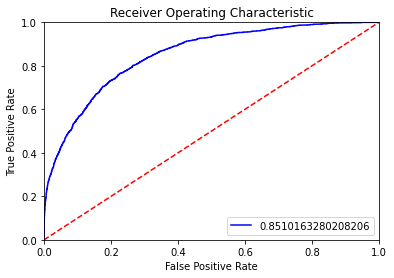

In [49]:
# Standard code to print ROC Curve.
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr,tpr, 'b', label = auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [50]:
# Above we have done Step1 AUC value for all the threshold now we will find AUC for threshold = 0.46 and compare it
from sklearn import metrics
#y_pred_class is the list of predicted values on the basis of 0.46 threshold
fpr, tpr,z = metrics.roc_curve(Y_test, y_pred_class)
auc = metrics.auc(fpr,tpr)
print(auc)
print(fpr)
print(tpr)

0.7079857322331378
[0.         0.06910952 1.        ]
[0.         0.48508099 1.        ]


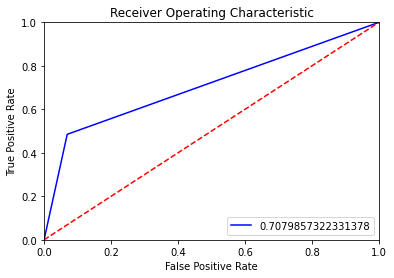

In [71]:
# Printing ROC Curve & AUC for threshold value for 0.46
import matplotlib.pyplot as plt

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.show()

In [51]:
# Let's check for threshold = 0.47
y_pred_class_new=[]
for value in y_pred_prob[:,1]:
    if value > 0.47:
        y_pred_class_new.append(1)
    else:
        y_pred_class_new.append(0)
print(y_pred_class_new)

[0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 

In [52]:
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cfm=confusion_matrix(Y_test,y_pred_class_new)
print(cfm)
acc_new = accuracy_score(Y_test, y_pred_class_new)
print("Accuracy of the model: ",acc_new)
print(classification_report(Y_test, y_pred_class_new))

[[6938  485]
 [1233 1113]]
Accuracy of the model:  0.8241375780530249
              precision    recall  f1-score   support

           0       0.85      0.93      0.89      7423
           1       0.70      0.47      0.56      2346

    accuracy                           0.82      9769
   macro avg       0.77      0.70      0.73      9769
weighted avg       0.81      0.82      0.81      9769



In [54]:
# Above we have done Step1 AUC value for all the threshold now we will find AUC for threshold = 0.46 and compare it
from sklearn import metrics
# y_pred_class_new is the predicted value for threshold value = 0.47
fpr, tpr,z = metrics.roc_curve(Y_test, y_pred_class_new)
auc = metrics.auc(fpr,tpr)
print(auc)
print(fpr)
print(tpr)

0.7045435438963642
[0.         0.06533746 1.        ]
[0.         0.47442455 1.        ]


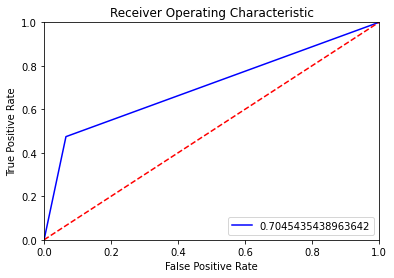

In [55]:
# Printing ROC Curve & AUC for threshold value for 0.46
import matplotlib.pyplot as plt

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.show()

In [76]:
# Based on Threshold value = 0.46 and 0.47 we can sae that thrshold value = 0.46 is optimum.

# Adult TEST Data

Now we will execute Test data and check our predictions whether it is similar or close to Train data.

In [56]:
# Read the Test Data
adult_test = pd.read_csv(r"adult_test.csv",
                       header = None, delimiter = ' *, *')
adult_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K.
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K.
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K.
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K.
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K.


In [57]:
# Renaming the Columns
adult_test.columns = ['age', 'workclass', 'fnlwgt', 'education', 'education_num',
                    'marital_status', 'occupation', 'relationship',
                    'race', 'sex', 'capital_gain', 'capital_loss',
                    'hours_per_week', 'native_country', 'income']
adult_test.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K.
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K.
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K.
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K.
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K.


In [59]:
adult_test.shape

(16281, 15)

In [60]:
adult_test.dtypes

age                int64
workclass         object
fnlwgt             int64
education         object
education_num      int64
marital_status    object
occupation        object
relationship      object
race              object
sex               object
capital_gain       int64
capital_loss       int64
hours_per_week     int64
native_country    object
income            object
dtype: object

In [61]:
adult_test.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64

# PreProcessing of the TEST Data 

In [62]:
# Replace ? with NaN
adult_test = adult_test.replace(["?"], np.nan)

In [63]:
# Check for missing value
adult_test.isnull().sum()

age                 0
workclass         963
fnlwgt              0
education           0
education_num       0
marital_status      0
occupation        966
relationship        0
race                0
sex                 0
capital_gain        0
capital_loss        0
hours_per_week      0
native_country    274
income              0
dtype: int64

In [64]:
# Dropping irrelavant data
adult_test = adult_test.drop(["fnlwgt", "education"], axis = 1)
adult_test.shape

(16281, 13)

In [65]:
adult_test.workclass.mode()

0    Private
dtype: object

In [66]:
# mode Imputation for missing value
for i in ["workclass", "occupation", "native_country"]:
    adult_test[i].fillna(adult_test[i].mode()[0], inplace = True)

In [67]:
adult_test.isnull().sum()

age               0
workclass         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64

#  LabelEncoder

In [68]:
# Converting Categorical value to numerical
colname_new = []
for x in adult_test.columns:
    if adult_test[x].dtypes == "object":
        colname_new.append(x)
colname_new

['workclass',
 'marital_status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'native_country',
 'income']

In [69]:
from sklearn import preprocessing
le=preprocessing.LabelEncoder()
for x in colname_new:
    adult_test[x]=le.fit_transform(adult_test[x])
    le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
    print('Feature', x)
    print('mapping', le_name_mapping)

Feature workclass
mapping {'Federal-gov': 0, 'Local-gov': 1, 'Never-worked': 2, 'Private': 3, 'Self-emp-inc': 4, 'Self-emp-not-inc': 5, 'State-gov': 6, 'Without-pay': 7}
Feature marital_status
mapping {'Divorced': 0, 'Married-AF-spouse': 1, 'Married-civ-spouse': 2, 'Married-spouse-absent': 3, 'Never-married': 4, 'Separated': 5, 'Widowed': 6}
Feature occupation
mapping {'Adm-clerical': 0, 'Armed-Forces': 1, 'Craft-repair': 2, 'Exec-managerial': 3, 'Farming-fishing': 4, 'Handlers-cleaners': 5, 'Machine-op-inspct': 6, 'Other-service': 7, 'Priv-house-serv': 8, 'Prof-specialty': 9, 'Protective-serv': 10, 'Sales': 11, 'Tech-support': 12, 'Transport-moving': 13}
Feature relationship
mapping {'Husband': 0, 'Not-in-family': 1, 'Other-relative': 2, 'Own-child': 3, 'Unmarried': 4, 'Wife': 5}
Feature race
mapping {'Amer-Indian-Eskimo': 0, 'Asian-Pac-Islander': 1, 'Black': 2, 'Other': 3, 'White': 4}
Feature sex
mapping {'Female': 0, 'Male': 1}
Feature native_country
mapping {'Cambodia': 0, 'Canada'

In [70]:
adult_test.head(10)

,age,workclass,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,25,3,7,4,6,3,2,1,0,0,40,37,0
1,38,3,9,2,4,0,4,1,0,0,50,37,0
2,28,1,12,2,10,0,4,1,0,0,40,37,1
3,44,3,10,2,6,0,2,1,7688,0,40,37,1
4,18,3,10,4,9,3,4,0,0,0,30,37,0
5,34,3,6,4,7,1,4,1,0,0,30,37,0
6,29,3,9,4,9,4,2,1,0,0,40,37,0
7,63,5,15,2,9,0,4,1,3103,0,32,37,1
8,24,3,10,4,7,4,4,0,0,0,40,37,0
9,55,3,4,2,2,0,4,1,0,0,10,37,0


In [71]:
# Spliting the data
X_test = adult_test.values[ : , 0 : -1]
Y_test = adult_test.values[ : , -1]

In [72]:
X_test

array([[   25,     3,     7,     4,     6,     3,     2,     1,     0,
            0,    40,    37],
       [   38,     3,     9,     2,     4,     0,     4,     1,     0,
            0,    50,    37],
       [   28,     1,    12,     2,    10,     0,     4,     1,     0,
            0,    40,    37],
       [   44,     3,    10,     2,     6,     0,     2,     1,  7688,
            0,    40,    37],
       [   18,     3,    10,     4,     9,     3,     4,     0,     0,
            0,    30,    37],
       [   34,     3,     6,     4,     7,     1,     4,     1,     0,
            0,    30,    37],
       [   29,     3,     9,     4,     9,     4,     2,     1,     0,
            0,    40,    37],
       [   63,     5,    15,     2,     9,     0,     4,     1,  3103,
            0,    32,    37],
       [   24,     3,    10,     4,     7,     4,     4,     0,     0,
            0,    40,    37],
       [   55,     3,     4,     2,     2,     0,     4,     1,     0,
            0,    10

In [74]:
# Y variable should be of Integer type
Y_test = Y_test.astype("int")

# Scalling the Data

In [75]:
from sklearn.preprocessing import StandardScaler
# Create a object and assign it to Function
scaler = StandardScaler()
# fit() function will learn the data on all values of X.
scaler.fit(X_test)
# transform() will transform all the value in scalling. Formula = (X - mean) / Std Deviation. 
X_test = scaler.transform(X_test)
print(X_test)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [76]:
# Since we have run the Model on Train data we will predict on Test data because classifier is the object on which we have run our model
y_pred_prob_test = classifier.predict_proba(X_test)

In [77]:
y_pred_prob_test

array([[9.78943333e-01, 2.10566673e-02],
       [7.90412187e-01, 2.09587813e-01],
       [6.91510987e-01, 3.08489013e-01],
       [2.51876475e-01, 7.48123525e-01],
       [9.82412345e-01, 1.75876551e-02],
       [9.75154240e-01, 2.48457598e-02],
       [9.59090254e-01, 4.09097457e-02],
       [1.42808825e-01, 8.57191175e-01],
       [9.73819588e-01, 2.61804118e-02],
       [9.74126560e-01, 2.58734398e-02],
       [2.06191374e-01, 7.93808626e-01],
       [5.14704868e-01, 4.85295132e-01],
       [9.71905896e-01, 2.80941045e-02],
       [7.52618949e-01, 2.47381051e-01],
       [5.14407796e-01, 4.85592204e-01],
       [3.70370875e-01, 6.29629125e-01],
       [9.69798509e-01, 3.02014915e-02],
       [9.61660058e-01, 3.83399419e-02],
       [9.89727030e-01, 1.02729699e-02],
       [3.75473349e-01, 6.24526651e-01],
       [5.61164972e-01, 4.38835028e-01],
       [9.72991306e-01, 2.70086938e-02],
       [9.77069140e-01, 2.29308600e-02],
       [7.78369353e-01, 2.21630647e-01],
       [6.808344

In [78]:
y_pred_test_class=[]
for value in y_pred_prob_test[:,1]:
    if value > 0.46:
        y_pred_test_class.append(1)
    else:
        y_pred_test_class.append(0)
print(y_pred_test_class)

[0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 

In [79]:
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cfm=confusion_matrix(Y_test,y_pred_test_class)
print(cfm)
acc_test=accuracy_score(Y_test, y_pred_test_class)
print("Accuracy of the model: ",acc_test)
print(classification_report(Y_test, y_pred_test_class))

[[11519   916]
 [ 1955  1891]]
Accuracy of the model:  0.8236594803758983
              precision    recall  f1-score   support

           0       0.85      0.93      0.89     12435
           1       0.67      0.49      0.57      3846

    accuracy                           0.82     16281
   macro avg       0.76      0.71      0.73     16281
weighted avg       0.81      0.82      0.81     16281



In [80]:
print("Accuracy of the Train Model is :", acc)
print("Accuracy of the Test Model is :", acc_test)

Accuracy of the Train Model is : 0.8238304841846658
Accuracy of the Test Model is : 0.8236594803758983


AUC AND ROC CURVE

In [81]:
from sklearn import metrics
fpr, tpr,z = metrics.roc_curve(Y_test, y_pred_prob_test[:,1])
auc_test = metrics.auc(fpr,tpr)
print(auc_test)
print(fpr)
print(tpr)

0.8513035020797696
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 8.04181745e-05 8.04181745e-05 1.60836349e-04 1.60836349e-04
 2.41254524e-04 2.41254524e-04 3.21672698e-04 3.21672698e-04
 3.21672698e-04 3.21672698e-04 4.02090873e-04 4.02090873e-04
 4.82509047e-04 4.82509047e-04 5.62927222e-04 5.62927222e-04
 6.43345396e-04 6.43345396e-04 7.23763571e-04 7.23763571e-04
 8.04181745e-04 8.04181745e-04 8.84599920e-04 8.84599920e-04
 1.04543627e-03 1.04543627e-03 1.12585444e-03 1.12585444e-03
 1.20627262e-03 1.20627262e-03 1.28669079e-03 1.28669079e-03
 1.36710897e-03 1.36710897e-03 1.44752714e-03 1.44752714e-03
 1.52794532e-03 1.52794532e-03 1.60836349e-03 1.60836349e-03
 1.68

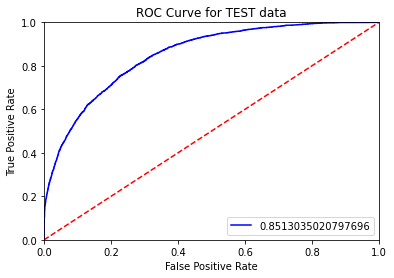

In [82]:
# Printing ROC Curve & AUC for predicted value
import matplotlib.pyplot as plt

plt.title('ROC Curve for TEST data')
plt.plot(fpr, tpr, 'b', label = auc_test)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.show()

In [83]:
from sklearn import metrics
fpr, tpr,z = metrics.roc_curve(Y_test, y_pred_test_class)
auc_test1 = metrics.auc(fpr,tpr)
print(auc_test1)
print(fpr)
print(tpr)

0.7090083096689368
[0.         0.07366305 1.        ]
[0.         0.49167967 1.        ]


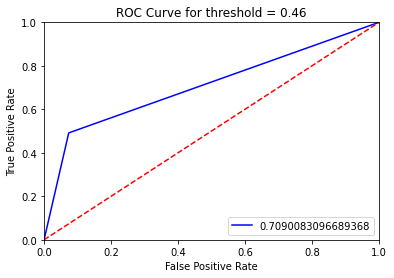

In [84]:
# Printing ROC Curve & AUC for threshold value for 0.46
import matplotlib.pyplot as plt

plt.title('ROC Curve for threshold = 0.46')
plt.plot(fpr, tpr, 'b', label = auc_test1)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.show()

In [85]:
print("AUC for Test Data is :", auc_test)
print("AUC for Test Data with threshold = 0.46 is :", auc_test1)

AUC for Test Data is : 0.8513035020797696
AUC for Test Data with threshold = 0.46 is : 0.7090083096689368


# CROSS-VALIDATION (K-Fold)

In [88]:
classifier=LogisticRegression()

#performing kfold_cross_validation
from sklearn.model_selection import KFold
# Since observation is less than 100000 we are using k(n_splits) = 10 fold, random_state = 10 divide data randomly.
kfold_cv=KFold(n_splits=10)
print(kfold_cv)

from sklearn.model_selection import cross_val_score
kfold_cv_result=cross_val_score(estimator=classifier,X=X_train, y=Y_train, cv=kfold_cv)
print(kfold_cv_result)
#finding the mean
print(kfold_cv_result.mean())



KFold(n_splits=10, random_state=None, shuffle=False)
[0.81842105 0.81403509 0.81790259 0.85037297 0.8293111  0.82492321
 0.80824923 0.8174638  0.83106626 0.82843352]
0.8240178825739205


In [89]:
# Compare the accuracy of Cross-Validate model and Base model it is only difference of 0.00018739
#in this case since difference is too low, we will consider Base Model
print("Accuracy of Base Model is :", acc)
print("Accuracy of Cross-Validate Model is :", kfold_cv_result.mean())
print("Difference between these 2 model is :", kfold_cv_result.mean() - acc)


Accuracy of Base Model is : 0.8238304841846658
Accuracy of Cross-Validate Model is : 0.8240178825739205
Difference between these 2 model is : 0.00018739838925474483


In [91]:
# If the difference is around 3% from CV Model and Base model then we can tune the model
# We are performing the test case on Training model
for train_value, test_value in kfold_cv.split(X_train):
    classifier.fit(X_train[train_value], Y_train[train_value]).predict(X_train[test_value])
# And prediction on Test data splitted from Training data
Y_pred=classifier.predict(X_test)
print(list(zip(Y_test,Y_pred)))

[(0, 0), (0, 0), (1, 0), (1, 1), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (1, 0), (1, 1), (0, 0), (0, 0), (0, 0), (1, 1), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 0), (0, 0), (0, 0), (0, 0), (1, 1), (1, 0), (0, 0), (0, 0), (0, 0), (1, 0), (0, 0), (0, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (1, 1), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (1, 0), (0, 0), (1, 1), (0, 0), (0, 0), (1, 0), (0, 1), (0, 0), (0, 0), (0, 0), (0, 0), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0),

In [92]:
# BAsed on the above code compute confusion Matrix
from sklearn.metrics import confusion_matrix, accuracy_score,classification_report

cfm=confusion_matrix(Y_test,Y_pred)
print(cfm)
print()


print("Classification report: ")

print(classification_report(Y_test,Y_pred))

acc=accuracy_score(Y_test, Y_pred)
print("Accuracy of the model: ",acc)


[[11700   735]
 [ 2115  1731]]

Classification report: 
              precision    recall  f1-score   support

           0       0.85      0.94      0.89     12435
           1       0.70      0.45      0.55      3846

    accuracy                           0.82     16281
   macro avg       0.77      0.70      0.72     16281
weighted avg       0.81      0.82      0.81     16281

Accuracy of the model:  0.8249493274368896
